In [272]:
%load_ext autoreload
%autoreload 2

import os
from pprint import pprint

from math import sqrt
import pickle
import copy
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.transforms import Affine2D

print(os.getcwd())

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/home/matthew/git/cadc_testing/uncertainty_eval


In [276]:
datasets = ['KITTI', 'CADC', 'NuScenes']
data_set_mode = datasets[0]
NETWORK_VAR_AVAILABLE = True
logdir = '/home/matthew/git/cadc_testing/pcdet_output/output_pkls'

if data_set_mode == 'KITTI':
    dataset_path = '/home/matthew/git/cadc_testing/WISEOpenLidarPerceptron/data/kitti'
#     preds_path = os.path.join(logdir, 'kitti/pp_mcdropout.pkl')
#     preds_path = os.path.join(logdir, 'kitti/pp_mimo_a.pkl')
    preds_path = os.path.join(logdir, 'kitti/pp_mimo_c.pkl')
#     preds_path = os.path.join(logdir, 'kitti/pp_ensemble.pkl')
#     preds_path = os.path.join(logdir, 'kitti/pp_mimo_c_new_params4.pkl')
    MIN_CLUSTER_SIZE = 2
    gts_path = os.path.join(logdir, 'kitti_infos_val.pkl')
#     gts_path = os.path.join(logdir, 'kitti_infos_train.pkl')
elif data_set_mode == 'CADC':
    dataset_path = '/home/matthew/git/cadc_testing/WISEOpenLidarPerceptron/data/cadc'
    preds_path = os.path.join(logdir, 'cadc_pp_baseline.pkl')
    gts_path = os.path.join(logdir, 'cadc_infos_val.pkl')
#     gts_path = os.path.join(logdir, 'cadc_infos_train.pkl')
elif data_set_mode == 'NuScenes':
    dataset_path = '/run/user/1000/gvfs/sftp:host=wisebob.eng.uwaterloo.ca,user=mapitrop/data/NuScenes/v1.0-trainval'
    preds_path = os.path.join(logdir, 'nuscenes/nuscenes_pp_baseline_20pc.pkl')
#     preds_path = os.path.join(logdir, 'nuscenes/nuscenes_pp_mimo_c.pkl')
    gts_path = os.path.join(logdir, 'nuscenes/nuscenes_infos_10sweeps_val.pkl')
#     gts_path = os.path.join(logdir, 'nuscenes/nuscenes_infos_10sweeps_train.pkl')

In [277]:
def load_dicts():
    # Load gt and prediction data dict
    with open(gts_path, 'rb') as f:
        gt_dicts = pickle.load(f)
    with open(preds_path, 'rb') as f:
        pred_dicts = pickle.load(f)
    return gt_dicts, pred_dicts

def load_image(frame_id):
    img_path = os.path.join(dataset_path, 'training', 'image_2', f'{frame_id}.png')
    return plt.imread(img_path)

def load_lidar(frame_id, xlim, ylim):
    lidar_path = os.path.join(dataset_path, 'training', 'velodyne', f'{frame_id}.bin')
    points = np.fromfile(lidar_path, dtype=np.float32).reshape(-1, 4)
    valid_mask = (points[:,0] > xlim[0]) & \
        (points[:,0] < xlim[1]) & \
        (points[:,1] > ylim[0]) & \
        (points[:,1] < ylim[1]) & \
        (points[:,2] < 4)
    points = points[valid_mask]
    return points

def load_image_cadc(sample_idx):
    date, set_num, idx = sample_idx
    img_path = os.path.join(dataset_path, date, set_num, 'labeled', 'image_00', 'data', '%s.png' % idx)
    return plt.imread(img_path)

def load_lidar_cadc(sample_idx, xlim, ylim):
    date, set_num, idx = sample_idx
    lidar_file = os.path.join(dataset_path, date, set_num, 'labeled', 'lidar_points', 'data', '%s.bin' % idx)
    points =  np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    valid_mask = (points[:,0] > xlim[0]) & \
        (points[:,0] < xlim[1]) & \
        (points[:,1] > ylim[0]) & \
        (points[:,1] < ylim[1]) & \
        (points[:,2] < 4)
    points = points[valid_mask]
    return points

def load_lidar_nuscenes(lidar_path, xlim, ylim):
    lidar_file = os.path.join(dataset_path, lidar_path)
    points =  np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 5)
    valid_mask = (points[:,0] > xlim[0]) & \
        (points[:,0] < xlim[1]) & \
        (points[:,1] > ylim[0]) & \
        (points[:,1] < ylim[1]) & \
        (points[:,2] < 4)
    points = points[valid_mask][...,:4]
    return points

def add_box(ax, box, color=None):
    # box: [x, y, z, w, l, h, theta]
    w = box[3]
    h = box[4]
    xy = (box[0] - w/2, box[1] - h/2)
    angle = box[-1] * 180 / np.pi
    box_rect = Rectangle(
        xy, w, h, facecolor='none', edgecolor=color
    )
    t = Affine2D().rotate_around(box[0], box[1], box[-1]) + ax.transData
    box_rect.set_transform(t)
    ax.add_patch(box_rect)

def add_box_vars(ax, box, box_vars, cluster_size, color=None):
    # box: [x, y, z, w, l, h, theta]
    w = box[3]
    sigma_w = sqrt(box_vars[3])
    h = box[4]
    sigma_h = sqrt(box_vars[4])
    # Confidence interval caluculations
    z_score = 1.96 # 95% CI
    w += z_score * sigma_w / sqrt(cluster_size)
    h += z_score * sigma_h / sqrt(cluster_size)
    xy = (box[0] - w/2, box[1] - h/2)
    angle = box[-1] * 180 / np.pi
    box_rect = Rectangle(
        xy, w, h, facecolor='tab:gray', edgecolor='tab:gray', alpha=0.5
    )
    t = Affine2D().rotate_around(box[0], box[1], box[-1]) + ax.transData
    box_rect.set_transform(t)
    ax.add_patch(box_rect)
    
def add_text(ax, box, text, color=None):
    # box: [x, y, z, w, l, h, theta]
    w = box[3]
    h = box[4]
#     xy = (box[0], box[1] - h)
    xy = (box[0] - w, box[1] - h)
    ax.text(xy[0], xy[1], text, color=color, backgroundcolor='white', fontsize=5, fontweight='bold')
    
def get_kitti_difficulty(occluded, truncated, bbox):
    DIFFICULTY = ['easy', 'moderate', 'hard']
    MIN_HEIGHT = [40, 25, 25]
    MAX_OCCLUSION = [0, 1, 2]
    MAX_TRUNCATION = [0.15, 0.3, 0.5]
    
    difficulty = []
    for i in range(len(occluded)):
        height = bbox[i][2] - bbox[i][1]
        for y in range(len(DIFFICULTY)):
            valid = (occluded[i] <= MAX_OCCLUSION[y] and
                truncated[i] <= MAX_TRUNCATION[y] and
                height > MIN_HEIGHT[y])
            if valid:
                difficulty.append(y)
                break
            if y == 2:
                difficulty.append(3)
    print(difficulty)
    return difficulty

In [278]:
# Load example GT and prediction
idx = np.random.randint(3700)
# idx = 2322, 291
idx = 0
print(idx)
gt_dicts, pred_dicts = load_dicts()

print('Example GT dict:')
print(gt_dicts[idx].keys())
print('Example pred dict:')
if NETWORK_VAR_AVAILABLE:
    print(pred_dicts[idx][0].keys())
    print(len(pred_dicts[idx]))
    print(len(pred_dicts[1][0]['name']) * 2)
    print(pred_dicts[0][0]['name'])
    print(len(pred_dicts[0][0]['name']))
    print(pred_dicts[0][0]['score'])
    print(len(pred_dicts[1][0]['name']))
    print(pred_dicts[1][0]['score'])
else:
    print(pred_dicts[idx].keys())
    print(len(pred_dicts[idx]))
    print(len(pred_dicts[1]['name']) * 2)
    print(pred_dicts[0]['name'])
    print(len(pred_dicts[0]['name']))
    print(pred_dicts[0]['score'])
    print(len(pred_dicts[1]['name']))
    print(pred_dicts[1]['score'])
    for pred in pred_dicts:
        print(len(pred['name']))

0
Example GT dict:
dict_keys(['point_cloud', 'image', 'calib', 'annos'])
Example pred dict:
dict_keys(['name', 'truncated', 'occluded', 'alpha', 'bbox', 'dimensions', 'location', 'rotation_y', 'score', 'score_all', 'boxes_lidar', 'pred_labels', 'target_labels', 'pred_vars', 'pred_head_ids', 'frame_id'])
2
34
['Car' 'Car' 'Car' 'Car' 'Pedestrian' 'Cyclist' 'Cyclist' 'Pedestrian'
 'Car' 'Pedestrian' 'Pedestrian' 'Car' 'Pedestrian' 'Pedestrian' 'Car'
 'Car' 'Pedestrian']
17
[0.5135486  0.3556925  0.32923394 0.28748846 0.26434198 0.20964102
 0.19914016 0.15257879 0.15255016 0.14997967 0.14237902 0.12370072
 0.12041342 0.11292072 0.10486265 0.1029717  0.10079015]
17
[0.75149876 0.53912055 0.4237574  0.3805369  0.27481753 0.21901229
 0.195276   0.19057813 0.16870235 0.15892391 0.15795626 0.15308568
 0.14492187 0.14234072 0.12685998 0.11368651 0.11150318]


In [279]:
# Cluster pred_dicts
from cluster import cluster_preds

print("Before clustering")
print("Number of frames", len(pred_dicts))
print("Number of pred dicts per frame", len(pred_dicts[0]))

if isinstance(pred_dicts[0], dict):
    print('No need to cluster')
else:
    print('Starting clustering')
    clustered_pred_dicts = cluster_preds(pred_dicts, data_set_mode, MODE='softmax', MIN_CLUSTER_SIZE=MIN_CLUSTER_SIZE)

    print("After clustering")
    print("Number of frames", len(clustered_pred_dicts))
    print("Is the output per frame now a single dict?", isinstance(clustered_pred_dicts[0], dict))

# import pickle

# pickle.dump( clustered_pred_dicts, open( 'pp_ensemble_clustered', "wb" ) )


  0%|          | 0/3769 [00:00<?, ?it/s]

Before clustering
Number of frames 3769
Number of pred dicts per frame 2
Starting clustering


100%|██████████| 3769/3769 [00:20<00:00, 183.96it/s]

After clustering
Number of frames 3769
Is the output per frame now a single dict? True


In [280]:
print(clustered_pred_dicts[0])

{'frame_id': '000001', 'seq_id': None, 'name': array(['Car', 'Car', 'Car', 'Car', 'Pedestrian', 'Cyclist', 'Cyclist',
       'Pedestrian', 'Car', 'Pedestrian', 'Pedestrian', 'Car',
       'Pedestrian', 'Pedestrian', 'Car', 'Car', 'Pedestrian'],
      dtype='<U10'), 'pred_labels': array([1, 1, 1, 1, 2, 3, 3, 2, 1, 2, 2, 1, 2, 2, 1, 1, 2]), 'score': array([0.5182446 , 0.35447913, 0.32830027, 0.28903246, 0.26090902,
       0.2060658 , 0.18565232, 0.14969724, 0.15857185, 0.1504299 ,
       0.14296943, 0.1236655 , 0.11692119, 0.11106285, 0.10533141,
       0.10209936, 0.1223018 ], dtype=float32), 'score_all': array([[5.18244624e-01, 3.41275808e-08, 3.41419337e-08, 4.81755227e-01],
       [3.54479134e-01, 2.49443879e-08, 2.49446170e-08, 6.45520806e-01],
       [3.28300267e-01, 2.19366640e-08, 2.19664571e-08, 6.71699703e-01],
       [2.89032459e-01, 1.32862734e-08, 1.32719684e-08, 7.10967481e-01],
       [4.34085266e-08, 2.60909021e-01, 4.34638778e-08, 7.39090800e-01],
       [4.51704594e-08,

# Visualization


In [281]:
# Shared values
if data_set_mode == 'KITTI':
    xlim = [0, 69.12]
    ylim = [-30, 30]
    # Frame index to display (4, 5 is a good frame to check)
    idx = 19 # 4 # 100 # 5, 19, 7
    PLOT_IMG = True
elif data_set_mode == 'CADC':
    xlim = [-50, 50]
    ylim = [-50, 50]
    idx = 1021
    PLOT_IMG = True
elif data_set_mode == 'NuScenes':
    xlim = [-50, 50]
    ylim = [-50, 50]
    idx = 0
    PLOT_IMG = False

scale = 0.32

# 1. View only GT

[1, 0, 0, 1, 2, 2, 0, 0]
GT frame_id 000039
{'name': array(['Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'DontCare', 'DontCare'],
      dtype='<U8'), 'truncated': array([ 0.2,  0. ,  0. ,  0. ,  0. ,  0. , -1. , -1. ]), 'occluded': array([ 0.,  0.,  0.,  1.,  2.,  2., -1., -1.]), 'alpha': array([  1.9 ,  -1.72,   1.64,   1.46,   1.58,  -1.62, -10.  , -10.  ]), 'bbox': array([[114.51, 193.47, 466.61, 374.  ],
       [683.15, 184.41, 776.5 , 256.99],
       [533.53, 177.81, 574.19, 212.8 ],
       [653.23, 180.26, 702.93, 220.26],
       [561.27, 178.49, 585.9 , 201.02],
       [639.85, 175.24, 667.59, 200.41],
       [592.47, 174.46, 612.16, 191.57],
       [619.98, 175.02, 635.65, 186.52]], dtype=float32), 'dimensions': array([[ 4.3 ,  1.48,  1.67],
       [ 3.62,  1.46,  1.54],
       [ 4.42,  1.52,  1.57],
       [ 3.92,  1.51,  1.58],
       [ 3.33,  1.46,  1.6 ],
       [ 3.54,  1.64,  1.7 ],
       [-1.  , -1.  , -1.  ],
       [-1.  , -1.  , -1.  ]]), 'location': array([[   -2.7 ,  

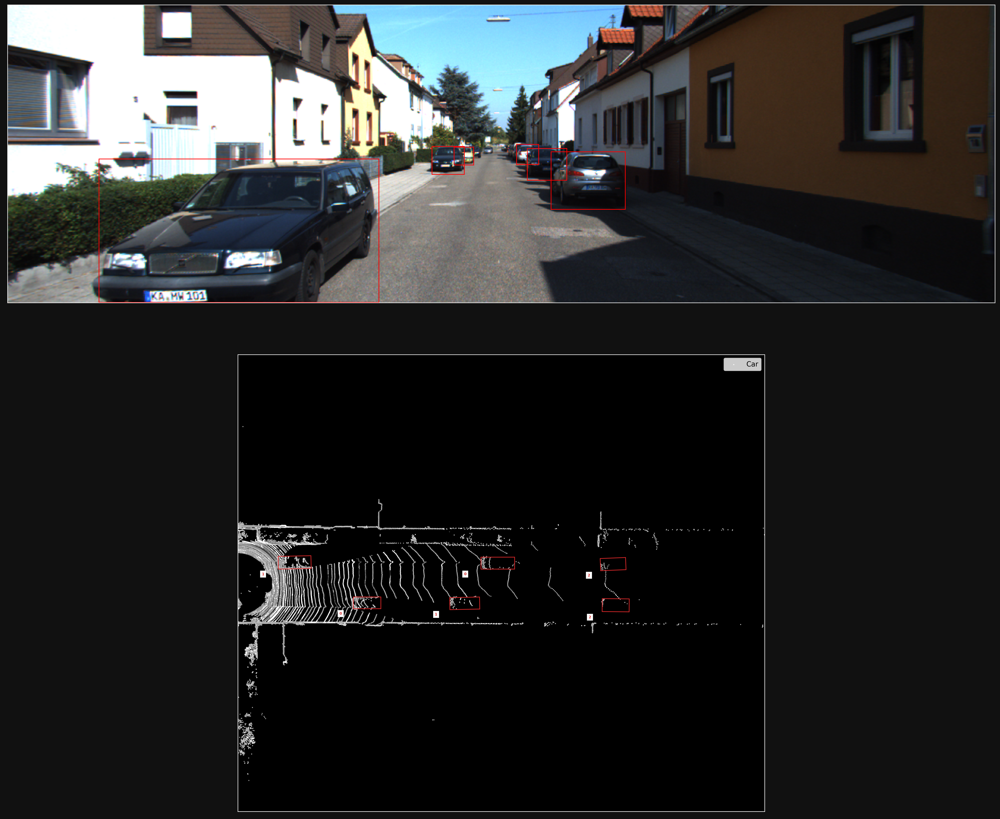

In [282]:
gt_dict = gt_dicts[idx]
# for i in range(len(gt_dicts)):
#     if gt_dicts[i]['point_cloud']['lidar_idx'] == '000267':
#         gt_dict = gt_dicts[i]
#         break
# print(gt_dict['annos'])
# for i in range(len(gt_dict['annos']['gt_boxes_lidar'])):
#     if gt_dict['annos']['gt_boxes_lidar'][i][0] < 0: # behind vehicle
#         continue
#     print('gt object:')
#     print('lidar z', gt_dict['annos']['gt_boxes_lidar'][i][2])
#     print('lidar height', gt_dict['annos']['gt_boxes_lidar'][i][5])
#     print('camera y', gt_dict['annos']['location'][i][1])
#     print('camera dimensions', gt_dict['annos']['dimensions'][i])
if data_set_mode == 'KITTI':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Cyclist': 3 }
    points = load_lidar(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image(gt_dict['image']['image_idx'])
    difficulty = get_kitti_difficulty(gt_dict['annos']['occluded'], gt_dict['annos']['truncated'], gt_dict['annos']['bbox'])
    gt_dict['annos']['difficulty'] = difficulty
    print('GT frame_id', gt_dict['image']['image_idx'])
elif data_set_mode == 'CADC':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Pickup_Truck': 3 }
    points = load_lidar_cadc(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image_cadc(gt_dict['image']['image_idx'])
elif data_set_mode == 'NuScenes':
    gt_dict = {
        'lidar_path': gt_dict['lidar_path'],
        'annos': {
            'name': gt_dict['gt_names'],
            'gt_boxes_lidar': gt_dict['gt_boxes'][..., :7],
            'num_points_in_gt': gt_dict['num_lidar_pts'] + gt_dict['num_radar_pts']
            
        }
    }
    name_to_label = { 'car': 1, 'truck':2, 'construction_vehicle':3, 'bus':4, 'trailer':5, \
               'barrier':6, 'motorcycle':7, 'bicycle':8, 'pedestrian':9, 'traffic_cone':10}
    points = load_lidar_nuscenes(gt_dict['lidar_path'], xlim, ylim)

plt.figure(figsize=(20, 18), facecolor=(0.067, 0.067, 0.067), dpi=300)

print(gt_dict['annos'])

if PLOT_IMG:
    ax = plt.subplot(211)
    for name, box, bbox in zip(gt_dict['annos']['name'], gt_dict['annos']['gt_boxes_lidar'], gt_dict['annos']['bbox']):
        if box[0] < 0: # behind vehicle
            continue
        # Create a Rectangle patch
        rect = Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
    plt.imshow(image)
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    for spine in ax.spines.values():
        spine.set_edgecolor('white')

ax = plt.subplot(212)

ax.scatter(points[::-1,0], points[::-1,1], marker='.', s=1.0, c=points[:,3], cmap='binary')

class_colors = ['tab:gray', 'tab:red', 'tab:orange', 'tab:pink', 'tab:gray']

if data_set_mode == 'KITTI':
    ax.legend(('Car', 'Pedestrian', 'Cyclist'))
    for name, box, diff in zip(gt_dict['annos']['name'], gt_dict['annos']['gt_boxes_lidar'], gt_dict['annos']['difficulty']):
        if name in name_to_label:
            label = name_to_label[name]
            add_box(ax, box, color=class_colors[label])
            add_text(ax, box, diff, color=class_colors[label])
elif data_set_mode == 'CADC':
    ax.legend(('Car', 'Pedestrian', 'Pickup_Truck'))
    for name, box, num_points in zip(gt_dict['annos']['name'], gt_dict['annos']['gt_boxes_lidar'], gt_dict['annos']['num_points_in_gt']):
        if name in name_to_label:
            label = name_to_label[name]
            add_box(ax, box, color=class_colors[label])
            add_text(ax, box, num_points, color=class_colors[label])
elif data_set_mode == 'NuScenes':
    ax.legend(('car','truck', 'construction_vehicle', 'bus', 'trailer', \
               'barrier', 'motorcycle', 'bicycle', 'pedestrian', 'traffic_cone'))
    class_colors = ['tab:gray', 'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red', \
                    'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red']
    for name, box, num_points in zip(gt_dict['annos']['name'], gt_dict['annos']['gt_boxes_lidar'], gt_dict['annos']['num_points_in_gt']):
        if name in name_to_label:
            label = name_to_label[name]
            add_box(ax, box, color=class_colors[label])
            add_text(ax, box, num_points, color=class_colors[label])

ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect(1)
ax.set_facecolor('black')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
for spine in ax.spines.values():
    spine.set_edgecolor('white')
    
plt.tight_layout()
plt.show()

# 2. View outputs from all forward passes

PRED frame_id 000039
PRED frame_id 000039


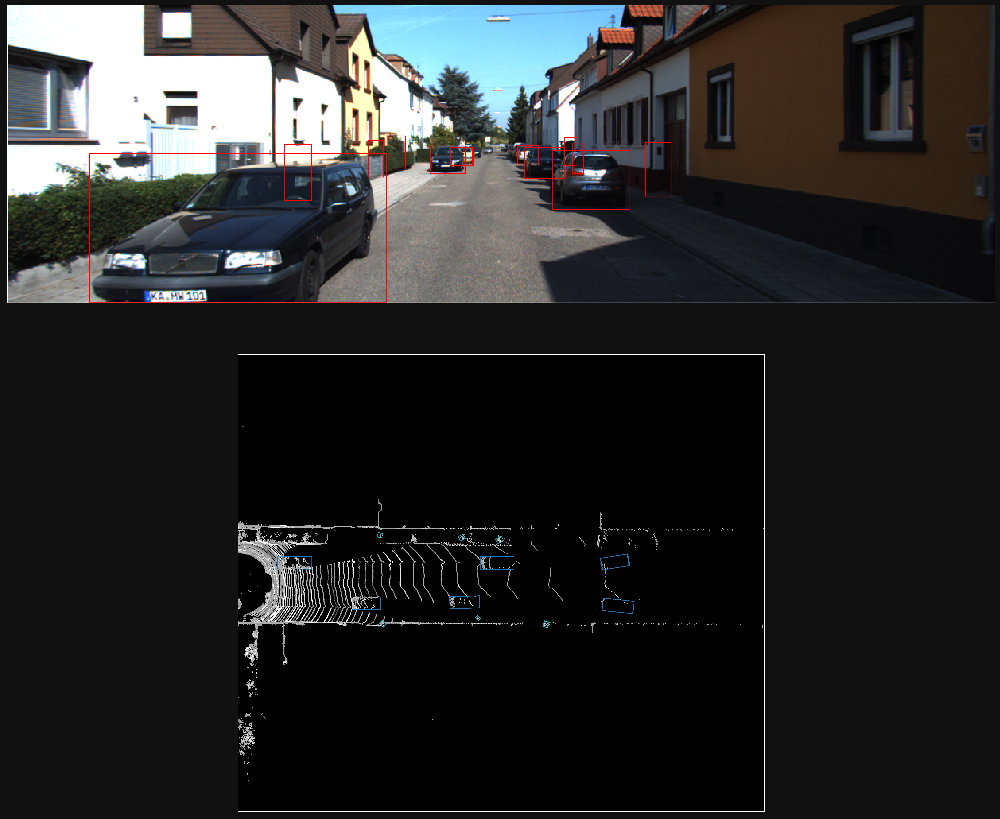

In [283]:
gt_dict = gt_dicts[idx]
pred_dict = copy.deepcopy(pred_dicts[idx])
if data_set_mode == 'kitti':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Cyclist': 3 }
    points = load_lidar(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image(gt_dict['image']['image_idx'])
elif data_set_mode == 'cadc':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Pickup_Truck': 3 }
    points = load_lidar_cadc(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image_cadc(gt_dict['image']['image_idx'])
elif data_set_mode == 'nuscenes':
    name_to_label = { 'car': 1, 'truck':2, 'construction_vehicle':3, 'bus':4, 'trailer':5, \
               'barrier':6, 'motorcycle':7, 'bicycle':8, 'pedestrian':9, 'traffic_cone':10}
    points = load_lidar_nuscenes(gt_dict['lidar_path'], xlim, ylim)

plt.figure(figsize=(20, 18), facecolor=(0.067, 0.067, 0.067), dpi=300)

if PLOT_IMG:
    ax = plt.subplot(211)
    if NETWORK_VAR_AVAILABLE:
        for single_pred_dict in pred_dict:
            print('PRED frame_id', single_pred_dict['frame_id'])
            for name, box, bbox in zip(single_pred_dict['name'], single_pred_dict['boxes_lidar'], single_pred_dict['bbox']):
                if box[0] < 0: # behind vehicle
                    continue
                # Create a Rectangle patch
                rect = Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none')
                # Add the patch to the Axes
                ax.add_patch(rect)
    else:
        for name, box, bbox in zip(pred_dict['name'], pred_dict['boxes_lidar'], pred_dict['bbox']):
            if box[0] < 0: # behind vehicle
                continue
            # Create a Rectangle patch
            rect = Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], linewidth=1, edgecolor='r', facecolor='none')
            # Add the patch to the Axes
            ax.add_patch(rect)

    plt.imshow(image)
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    for spine in ax.spines.values():
        spine.set_edgecolor('white')

ax = plt.subplot(212)

ax.scatter(points[::-1,0], points[::-1,1], marker='.', s=1.0, c=points[:,3], cmap='binary')

class_colors = ['tab:gray', 'tab:blue', 'tab:cyan', 'tab:green', 'tab:gray']

if data_set_mode == 'kitti':
    ax.legend(('Car', 'Pedestrian', 'Cyclist'))
elif data_set_mode == 'cadc':
    ax.legend(('Car', 'Pedestrian', 'Pickup_Truck'))
elif data_set_mode == 'nuscenes':
    ax.legend(('car','truck', 'construction_vehicle', 'bus', 'trailer', \
           'barrier', 'motorcycle', 'bicycle', 'pedestrian', 'traffic_cone'))
    class_colors = ['tab:gray', 'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red', \
                    'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red']

# Display all pred_dicts for a frame
if NETWORK_VAR_AVAILABLE:
    prediction_head_colors = ['tab:blue', 'tab:green']
    count = 0
    for single_pred_dict in pred_dict:
        for label, box, box_vars in zip(np.argmax(single_pred_dict['score_all'][:,:-1], axis=-1)+1,
                                        single_pred_dict['boxes_lidar'], single_pred_dict['pred_vars']):
            box_copy = copy.deepcopy(box)
            box_copy[2] += box_copy[5]/2
#             add_box_vars(ax, box_copy, box_vars, cluster_size=1, color=class_colors[label])
            add_box(ax, box_copy, color=class_colors[label])
#             add_box(ax, box_copy, color=prediction_head_colors[count])
        count += 1
else:
    for name, box in zip(pred_dict['name'], pred_dict['boxes_lidar']):
        label = name_to_label[name]
        add_box(ax, box, color=class_colors[label])

ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect(1)
ax.set_facecolor('black')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
for spine in ax.spines.values():
    spine.set_edgecolor('white')
    
plt.tight_layout()
plt.show()

# 3. View clustered output

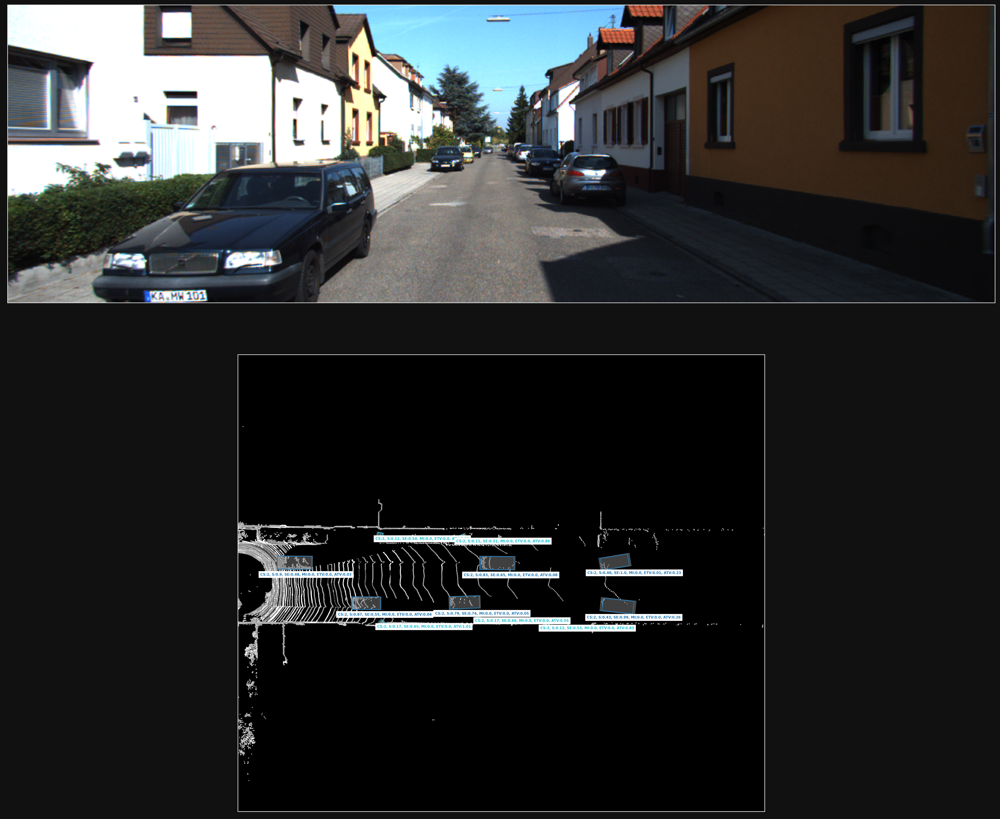

In [284]:
gt_dict = gt_dicts[idx]
pred_dict = copy.deepcopy(clustered_pred_dicts[idx])
if data_set_mode == 'kitti':
    points = load_lidar(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image(gt_dict['image']['image_idx'])
elif data_set_mode == 'cadc':
    points = load_lidar_cadc(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image_cadc(gt_dict['image']['image_idx'])
elif data_set_mode == 'nuscenes':
#     tmp_dim = copy.deepcopy(pred_dict['boxes_lidar'][..., 3])
#     pred_dict['boxes_lidar'][..., 3] = copy.deepcopy(pred_dict['boxes_lidar'][..., 4])
#     pred_dict['boxes_lidar'][..., 4] = tmp_dim
    name_to_label = { 'car': 1, 'truck':2, 'construction_vehicle':3, 'bus':4, 'trailer':5, \
               'barrier':6, 'motorcycle':7, 'bicycle':8, 'pedestrian':9, 'traffic_cone':10}
    points = load_lidar_nuscenes(gt_dict['lidar_path'], xlim, ylim)

plt.figure(figsize=(20, 18), facecolor=(0.067, 0.067, 0.067), dpi=300)

if PLOT_IMG:
    ax = plt.subplot(211)
    plt.imshow(image)
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    for spine in ax.spines.values():
        spine.set_edgecolor('white')

ax = plt.subplot(212)

ax.scatter(points[::-1,0], points[::-1,1], marker='.', s=1.0, c=points[:,3], cmap='binary')

# For KITTI and CADC
class_colors = ['tab:gray', 'tab:blue', 'tab:cyan', 'tab:green', 'tab:gray']

if data_set_mode == 'kitti':
    ax.legend(('Car', 'Pedestrian', 'Cyclist'))
elif data_set_mode == 'cadc':
    ax.legend(('Car', 'Pedestrian', 'Pickup_Truck'))
elif data_set_mode == 'nuscenes':
    ax.legend(('car','truck', 'construction_vehicle', 'bus', 'trailer', \
           'barrier', 'motorcycle', 'bicycle', 'pedestrian', 'traffic_cone'))
    class_colors = ['tab:gray', 'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red', \
                    'tab:red', 'tab:red', 'tab:red', 'tab:red', 'tab:red']

for softmax, box, box_vars, cluster_size, SE, MI, ETV, ATV in zip(pred_dict['score_all'],
                                pred_dict['boxes_lidar'], pred_dict['pred_vars'],
                                pred_dict['cluster_size'], pred_dict['shannon_entropy'],
                                pred_dict['mutual_info'], pred_dict['epistemic_total_var'],
                                pred_dict['aleatoric_total_var']):
#     if ETV < 0.05:
#         continue
    label = np.argmax(softmax[:-1])+1
    score = softmax[np.argmax(softmax[:-1])].round(2)
    add_box_vars(ax, box, box_vars, cluster_size=cluster_size, color=class_colors[label])
    add_box(ax, box, color=class_colors[label])
    output_txt = 'CS:' + str(cluster_size) + ', ' \
                 'S:'+ str(score.round(2)) + ', ' \
                 'SE:'+ str(SE.round(2)) + ', ' \
                 'MI:'+ str(MI.round(2)) + ', ' \
                 'ETV:'+ str(ETV.round(2)) + ', ' \
                 'ATV:'+ str(ATV.round(2))
    add_text(ax, box, output_txt, color=class_colors[label])

ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect(1)
ax.set_facecolor('black')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
for spine in ax.spines.values():
    spine.set_edgecolor('white')
    
plt.tight_layout()
plt.show()

# 4. View GT and clustered output

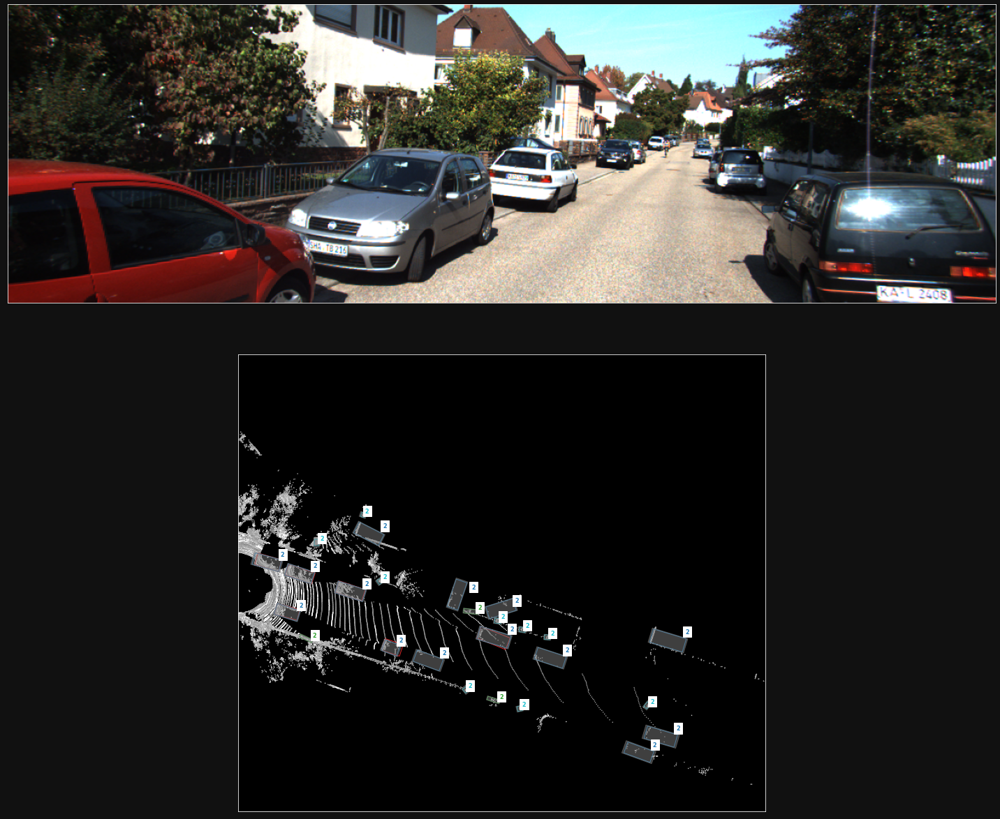

In [208]:
gt_dict = gt_dicts[idx]
pred_dict = clustered_pred_dicts[idx]
if data_set_mode == 'kitti':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Cyclist': 3 }
    points = load_lidar(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image(gt_dict['image']['image_idx'])
elif data_set_mode == 'cadc':
    name_to_label = { 'Car': 1, 'Pedestrian': 2, 'Pickup_Truck': 3 }
    points = load_lidar_cadc(gt_dict['image']['image_idx'], xlim, ylim)
    image = load_image_cadc(gt_dict['image']['image_idx'])

plt.figure(figsize=(20, 18), facecolor=(0.067, 0.067, 0.067))

ax = plt.subplot(211)
plt.imshow(image)
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
for spine in ax.spines.values():
    spine.set_edgecolor('white')

ax = plt.subplot(212)

ax.scatter(points[::-1,0], points[::-1,1], marker='.', s=1.0, c=points[:,3], cmap='binary')

if data_set_mode == 'kitti':
    ax.legend(('Car', 'Pedestrian', 'Cyclist'))
elif data_set_mode == 'cadc':
    ax.legend(('Car', 'Pedestrian', 'Pickup_Truck'))

class_colors = ['tab:gray', 'tab:red', 'tab:orange', 'tab:pink', 'tab:gray']
for name, box in zip(gt_dict['annos']['name'], gt_dict['annos']['gt_boxes_lidar']):
    if name in name_to_label:
        label = name_to_label[name]
        add_box(ax, box, color=class_colors[label])

class_colors = ['tab:gray', 'tab:blue', 'tab:cyan', 'tab:green', 'tab:gray']

if NETWORK_VAR_AVAILABLE:
    for label, box, box_vars, cluster_size in zip(np.argmax(single_pred_dict['score_all'][:,:-1], axis=-1)+1,
                                    single_pred_dict['boxes_lidar'], single_pred_dict['pred_vars'],
                                    pred_dict['cluster_size']):
        add_box(ax, box, color=class_colors[label])
        add_box_vars(ax, box, box_vars, cluster_size=cluster_size, color=class_colors[label])
        add_text(ax, box, cluster_size, color=class_colors[label])
else:
    for name, box in zip(pred_dict['name'], pred_dict['boxes_lidar']):
        label = name_to_label[name]
        add_box(ax, box, color=class_colors[label])

ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_aspect(1)
ax.set_facecolor('black')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
for spine in ax.spines.values():
    spine.set_edgecolor('white')
    
plt.tight_layout()
plt.show()